In [3]:
import pandas as pd
import numpy as np

In [4]:
air_p = pd.read_csv('./Datasets- I/AirPassengersImpute.csv')

In [5]:
air_p.columns = ['Date','Passengers']

In [6]:
air_p.head()

,Date,Passengers
0,1949-01,112
1,1949-02,118
2,1949-03,132
3,1949-04,129
4,1949-05,121


In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (12,8)

<AxesSubplot:xlabel='Date', ylabel='Passengers'>

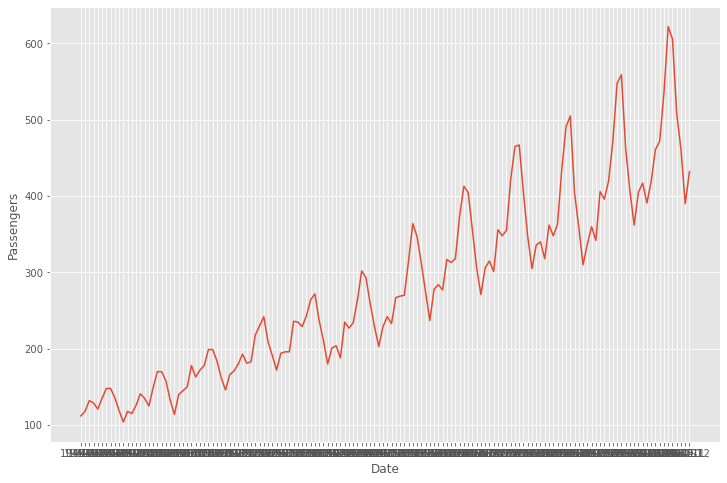

In [8]:
fig,ax = plt.subplots(figsize = (12,8))
sns.lineplot(data=air_p,x = 'Date', y = 'Passengers')

In [9]:
air_p['MA'] = air_p.Passengers.rolling(10).mean()

In [10]:
air_p['smooth'] = air_p.Passengers - air_p.MA

In [11]:
air_p.head(15)

,Date,Passengers,MA,smooth
0,1949-01,112,NaN,NaN
1,1949-02,118,NaN,NaN
2,1949-03,132,NaN,NaN
3,1949-04,129,NaN,NaN
4,1949-05,121,NaN,NaN
5,1949-06,135,NaN,NaN
6,1949-07,148,NaN,NaN
7,1949-08,148,NaN,NaN
8,1949-09,136,NaN,NaN
9,1949-10,119,129.8,-10.8


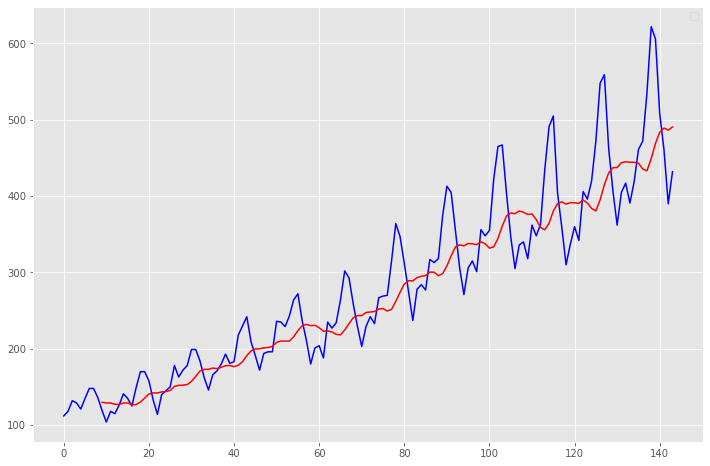

In [12]:
plt.plot(air_p.Passengers,c  = 'b',label = 'original')
plt.plot(air_p.MA,c  = 'r',label = 'MA')
plt.legend('best',['Normal','MA'])

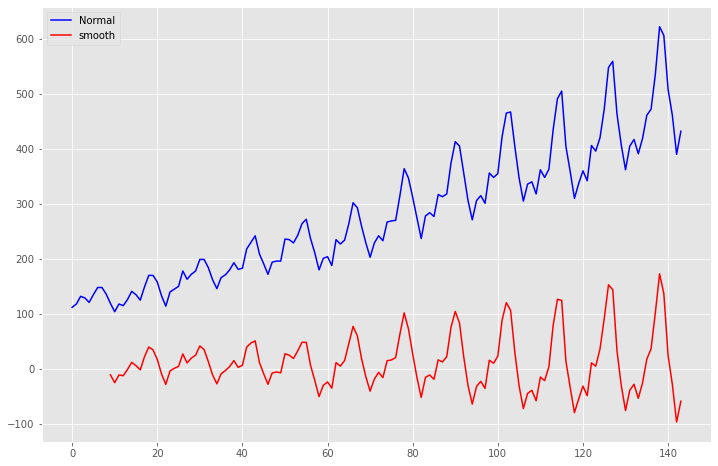

In [13]:
plt.plot(air_p.Passengers,c  = 'b',label = 'original')
plt.plot(air_p.smooth,c  = 'r',label = 'smooth')
plt.legend(['Normal','smooth'])

In [14]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

In [15]:
multiplicative_decomposition = seasonal_decompose(air_p['Passengers']\
                                                  , model='multiplicative', period=30)
additive_decomposition = seasonal_decompose(air_p['Passengers']\
                                                  , model='additive', period=30)

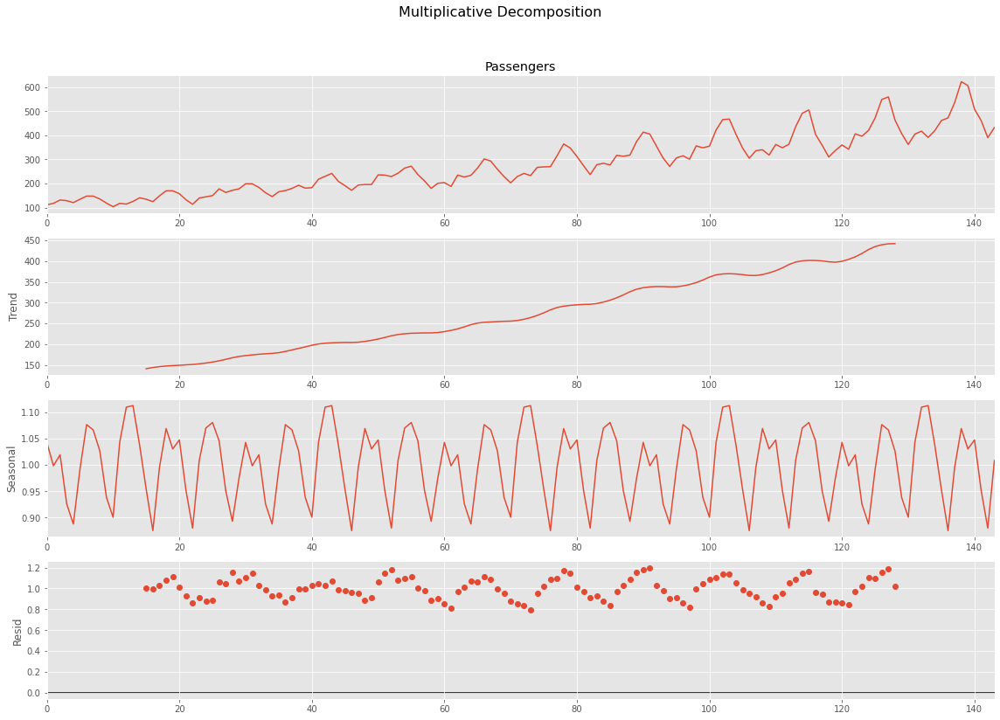

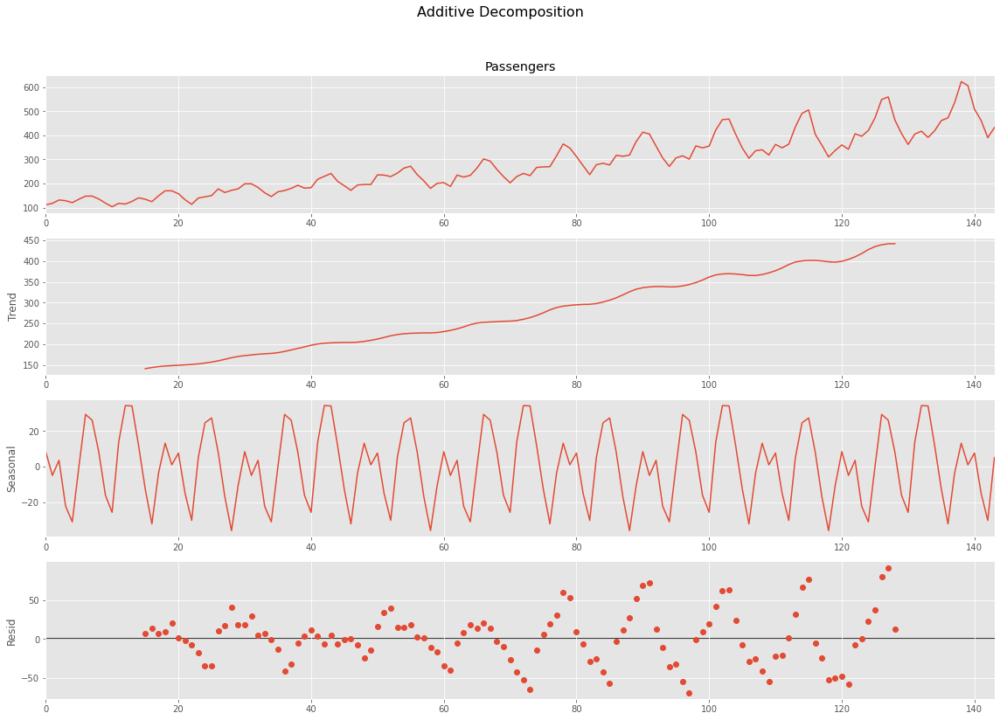

In [16]:
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

Text(0.5, 1.0, 'Air Passengers detrended by subtracting the least squares fit')

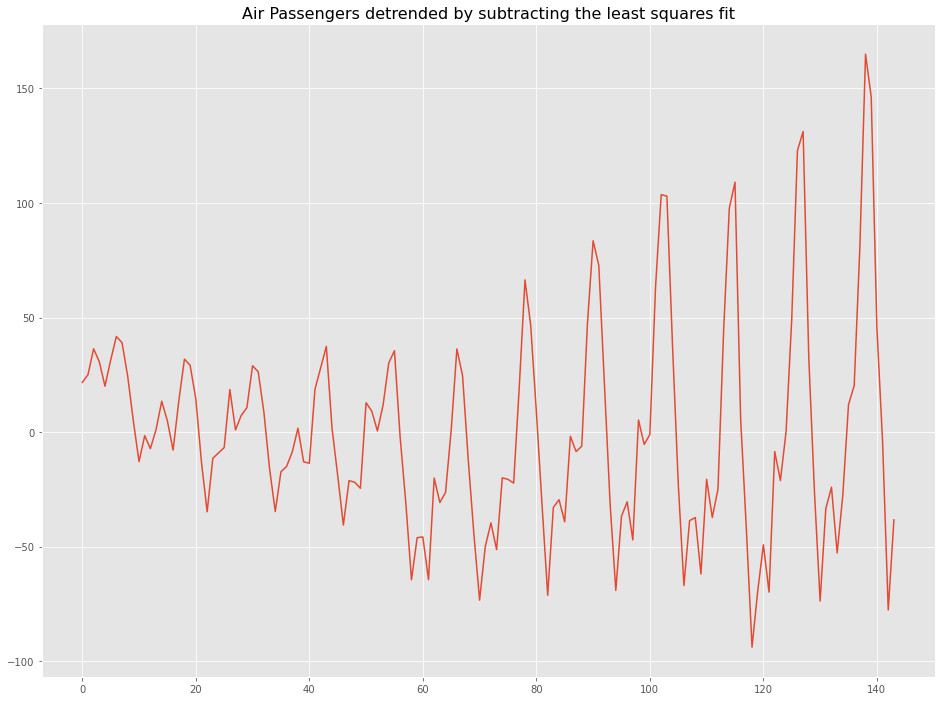

In [17]:

from scipy import signal
detrended = signal.detrend(air_p['Passengers'].values)
plt.plot(detrended)
plt.title('Air Passengers detrended by subtracting the least squares fit', fontsize=16)

Text(0.5, 1.0, 'Air Passengers detrended by subtracting the trend component')

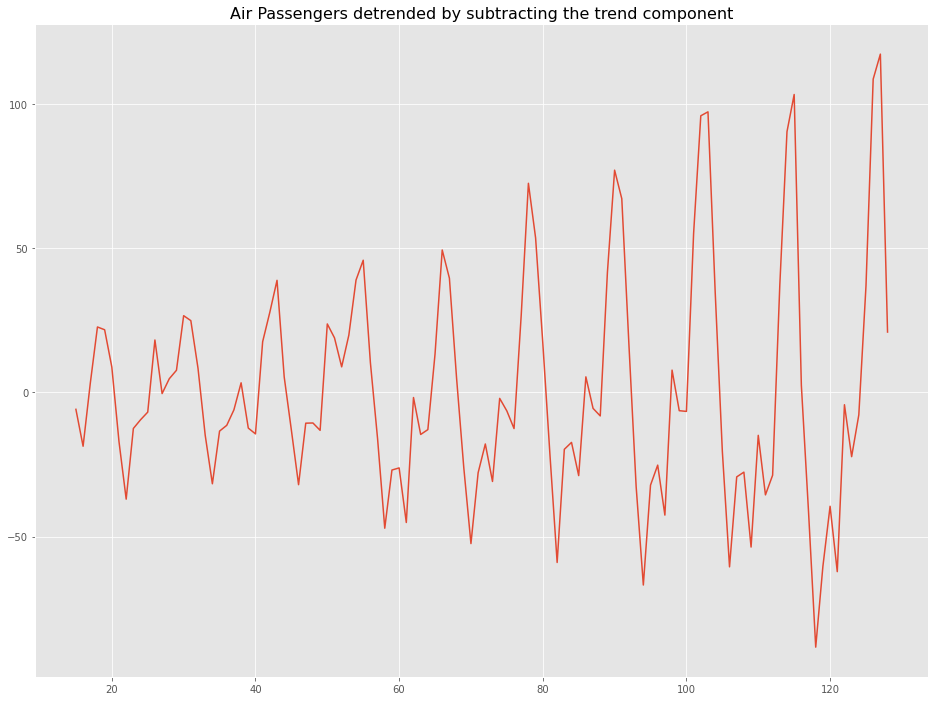

In [18]:
# Using statmodels: Subtracting the Trend Component
from statsmodels.tsa.seasonal import seasonal_decompose
result_mul = seasonal_decompose(air_p['Passengers'], model='multiplicative', period=30)
detrended = air_p['Passengers'].values - result_mul.trend
plt.plot(detrended)
plt.title('Air Passengers detrended by subtracting the trend component', fontsize=16)

[]

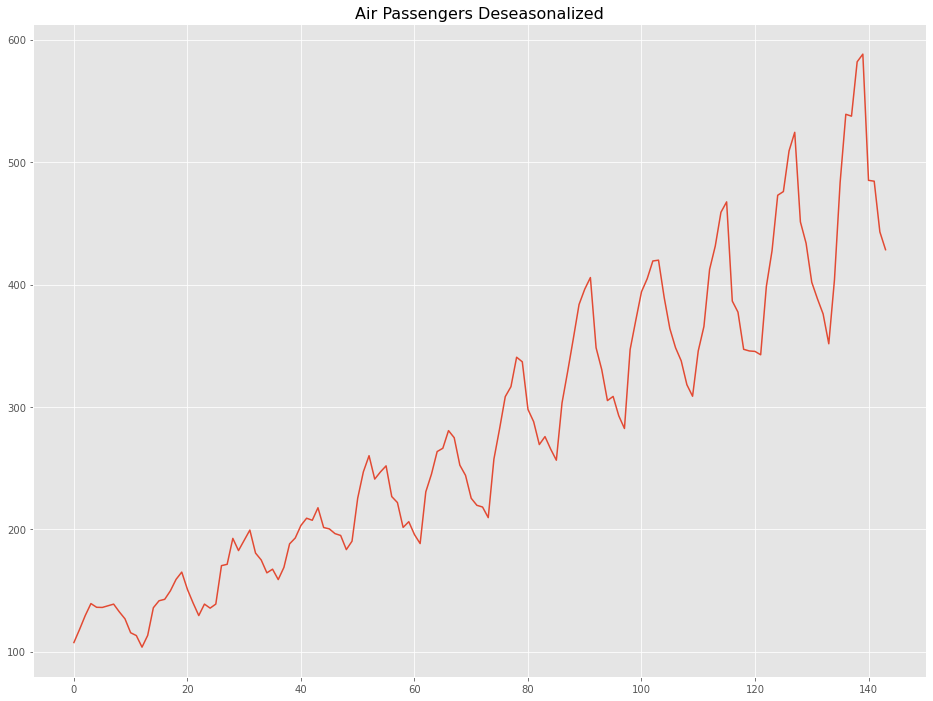

In [19]:
# Subtracting the Trend Component


# Time Series Decomposition
#result_mul = seasonal_decompose(air_p['Passengers'], model='multiplicative', period=30)

# Deseasonalize
deseasonalized = air_p['Passengers'].values / result_mul.seasonal


# Plot
plt.plot(deseasonalized)
plt.title('Air Passengers Deseasonalized', fontsize=16)
plt.plot()

In [20]:
import warnings
warnings.filterwarnings("ignore")

In [21]:
ac_data = pd.read_csv('./Datasets- I/AC_Data.csv',parse_dates=['0'], index_col=['0'])

In [22]:
ac_no_nan = ac_data.dropna()

In [23]:
ac = ac_data.resample('2min').mean()

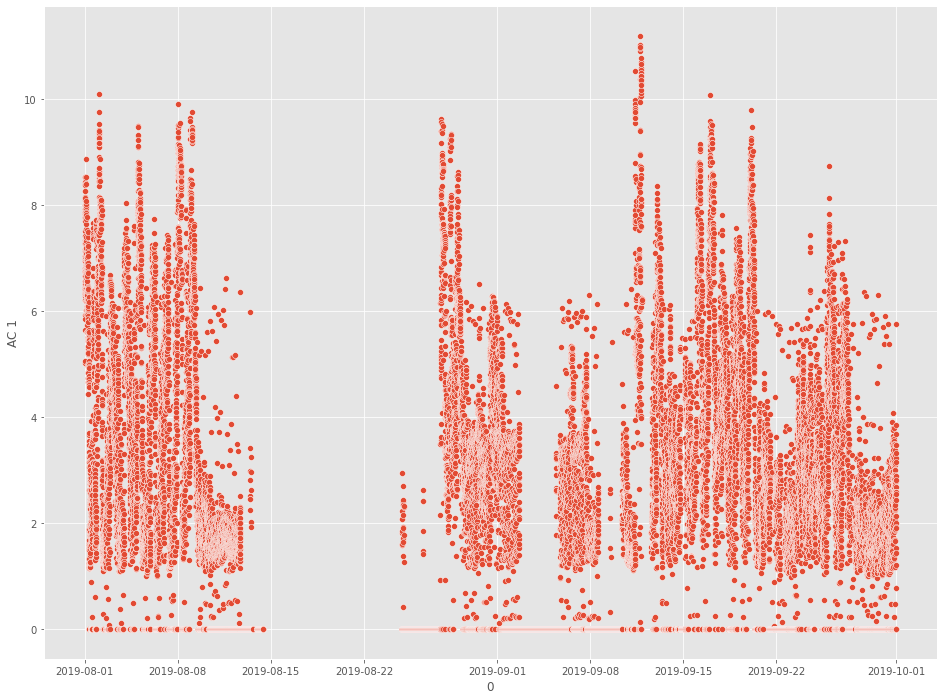

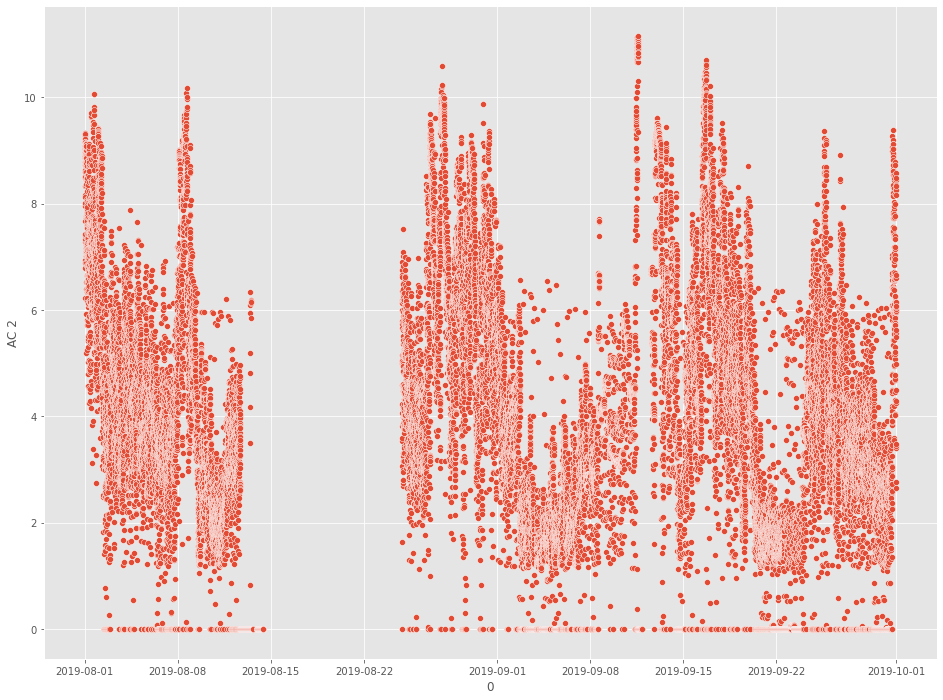

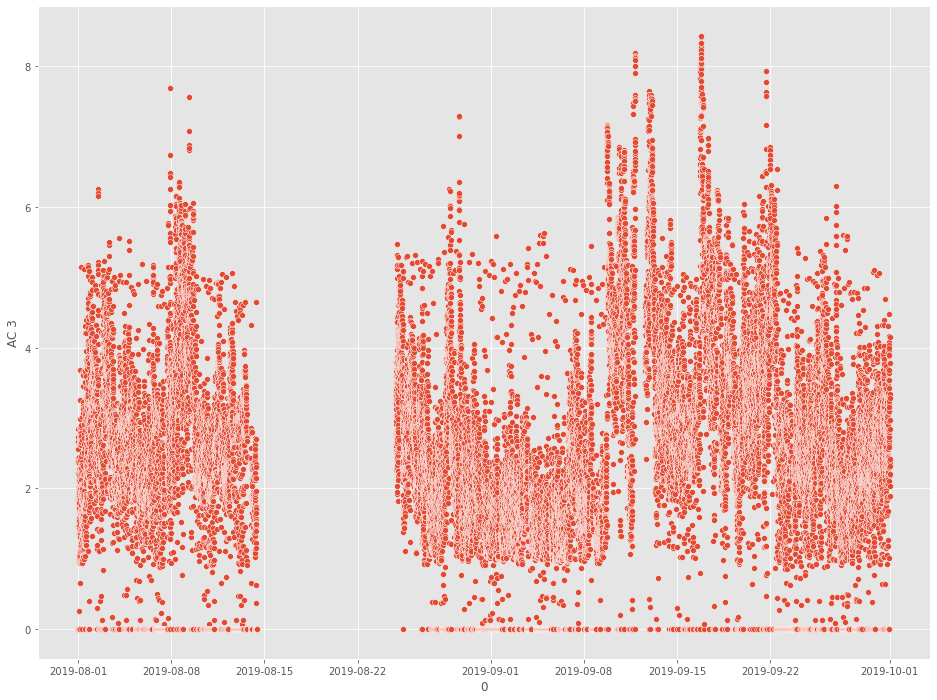

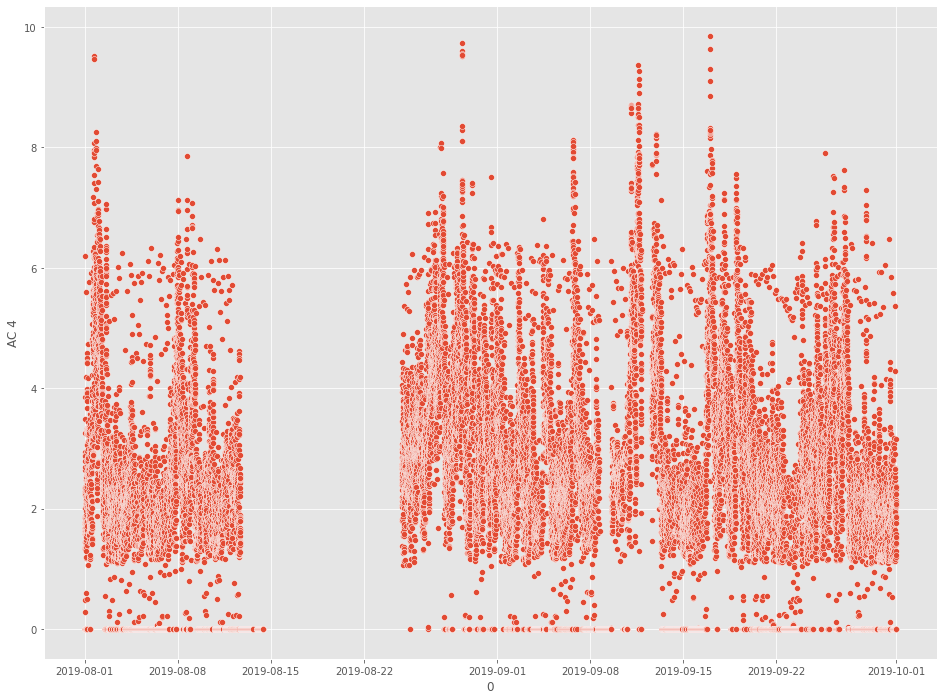

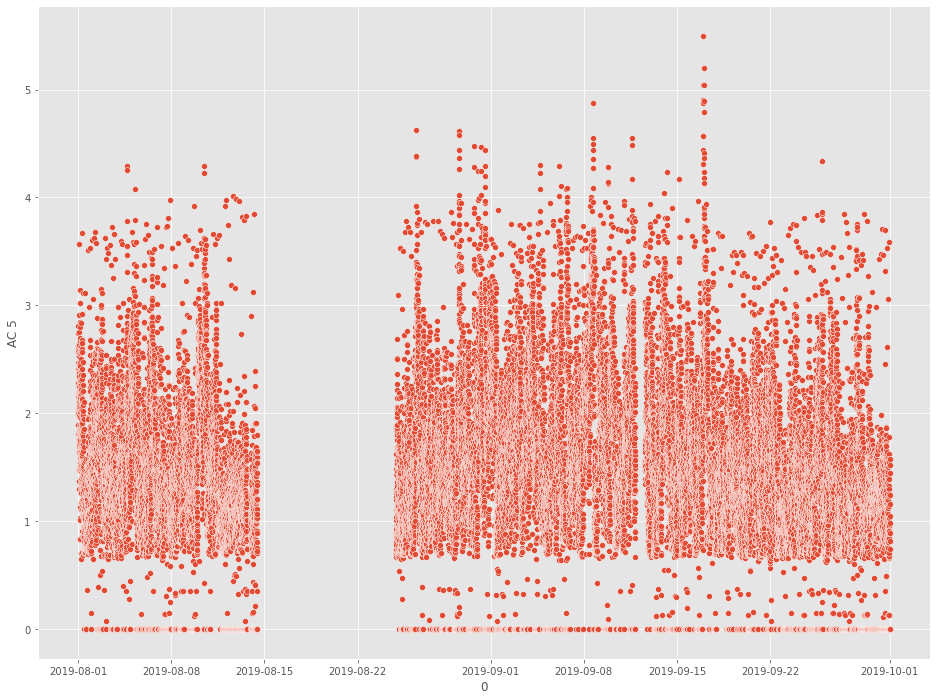

...

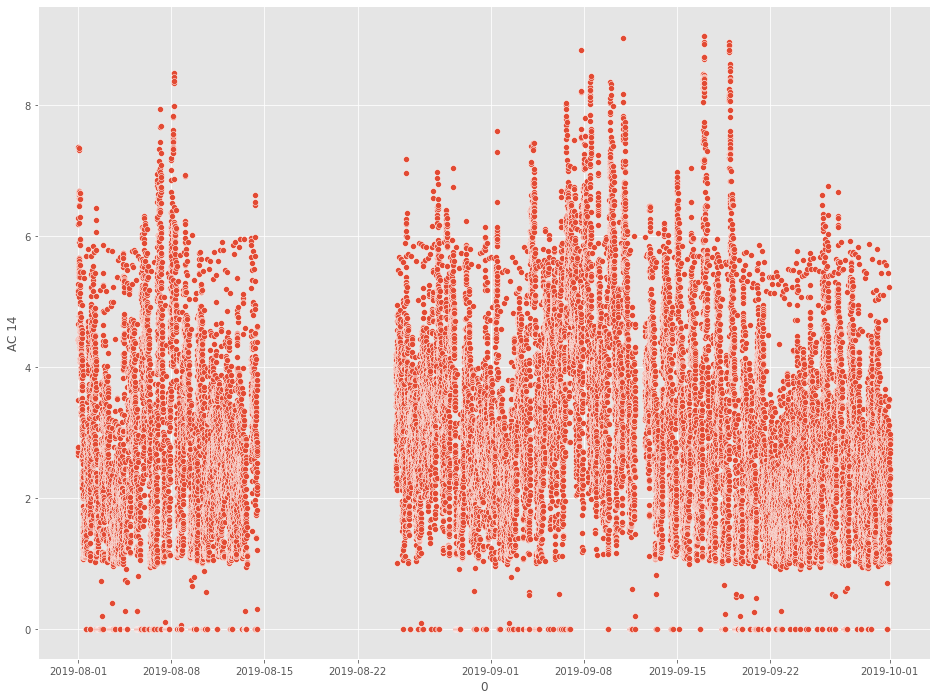

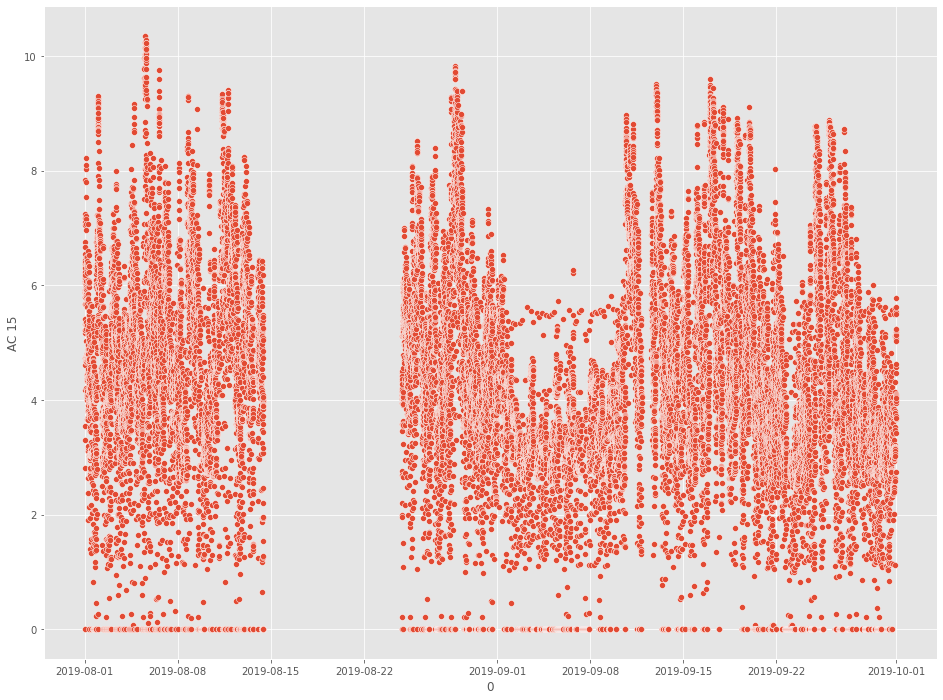

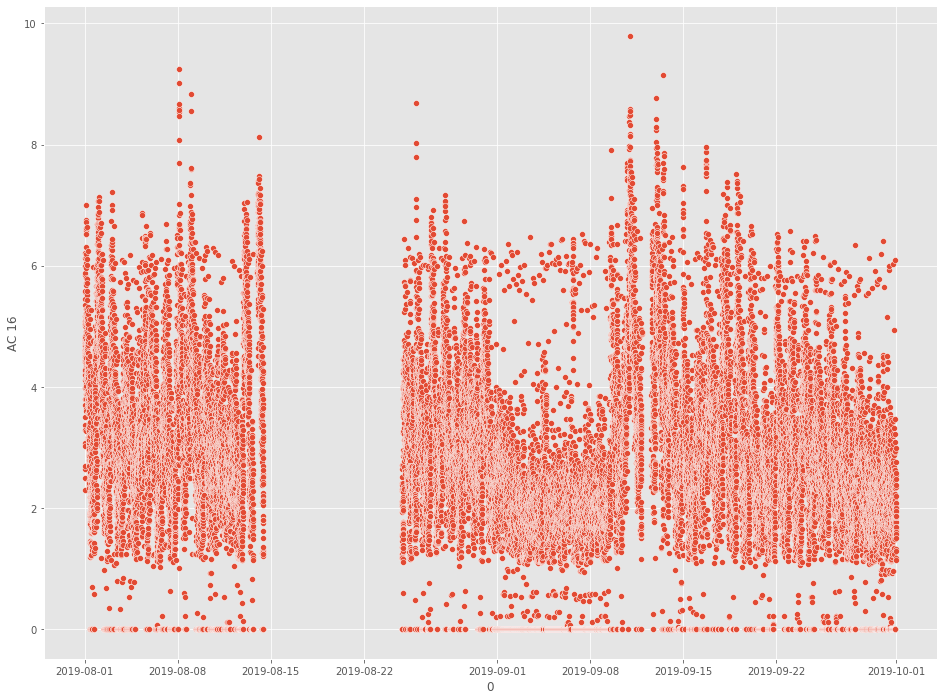

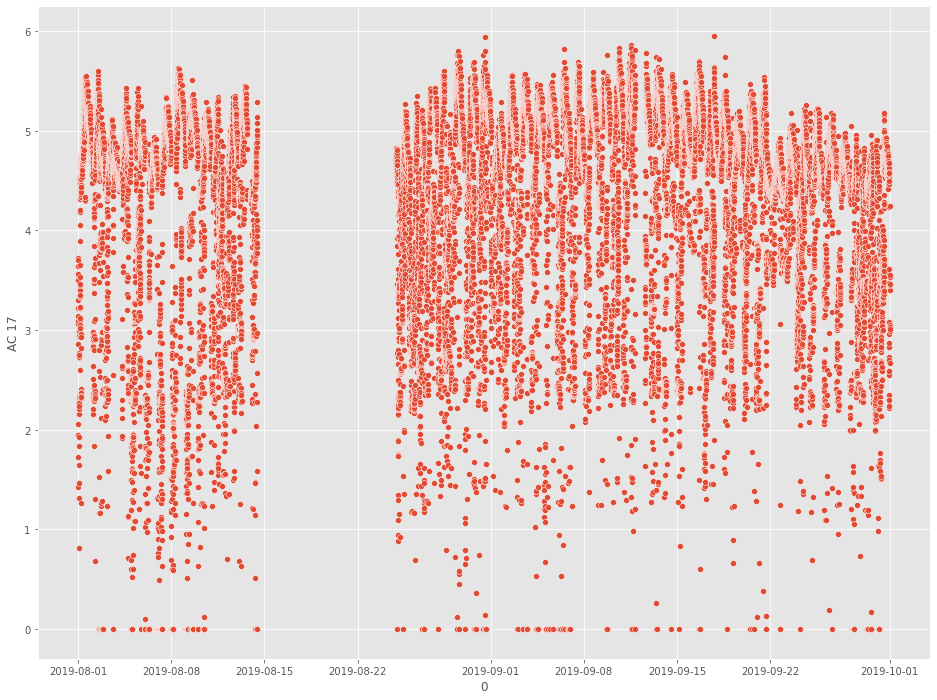

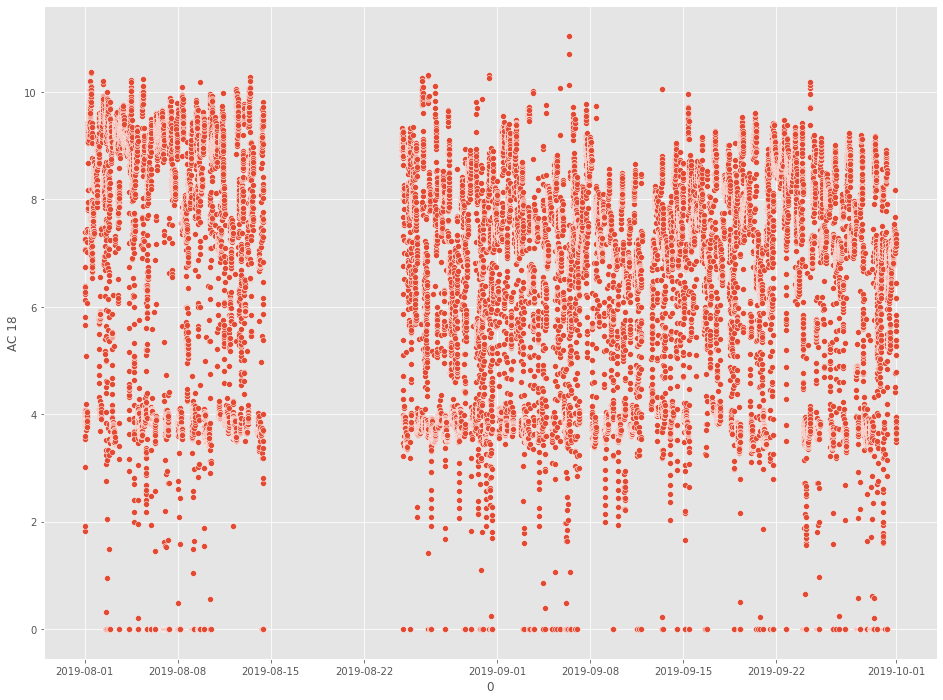

In [24]:
for i in ac_no_nan.columns:
    fig, ax = plt.subplots(figsize = (16,12))
    uni_ac = ac_no_nan.loc[:,i]
    sns.scatterplot(data = uni_ac)

In [26]:
data = ac_no_nan.loc[:,'AC 1']

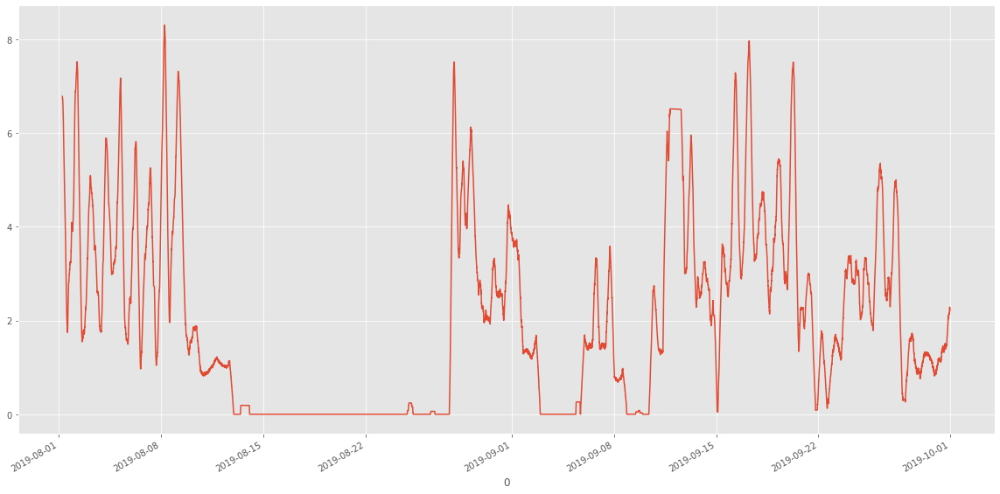

In [28]:
ax = data.rolling(200).mean().plot(figsize = (20,10))

In [34]:
additive_decomposition = seasonal_decompose(ac_no_nan.loc[:,'AC 1']\
                                                  , model='additive', period=30)

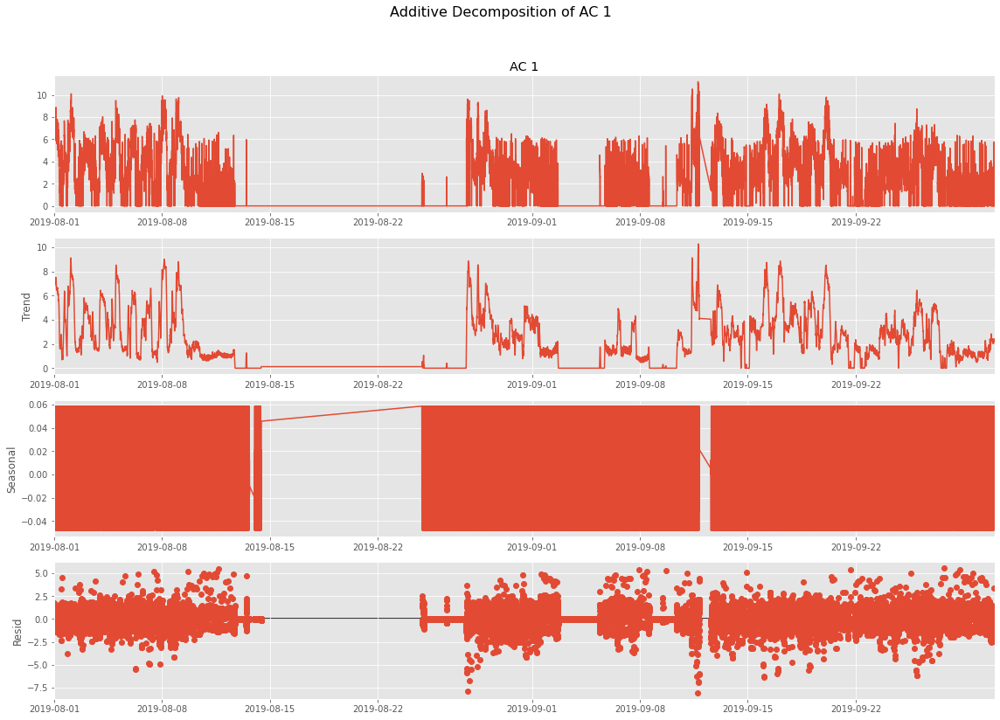

In [43]:
additive_decomposition.plot().suptitle('Additive Decomposition of AC 1', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

Text(0.5, 1.0, 'AC 1 detrended by subtracting the least squares fit')

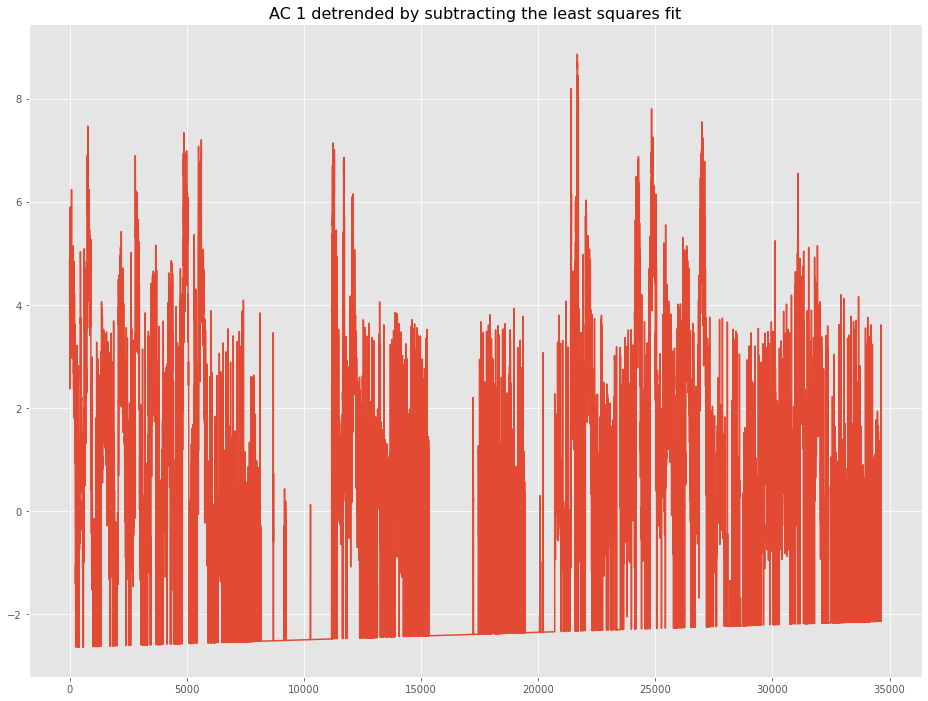

In [42]:
detrended = signal.detrend(ac_no_nan.loc[:,'AC 1'].values)
plt.plot(detrended)
plt.title('AC 1 detrended by subtracting the least squares fit', fontsize=16)

Text(0.5, 1.0, 'AC 1 detrended by subtracting the trend component')

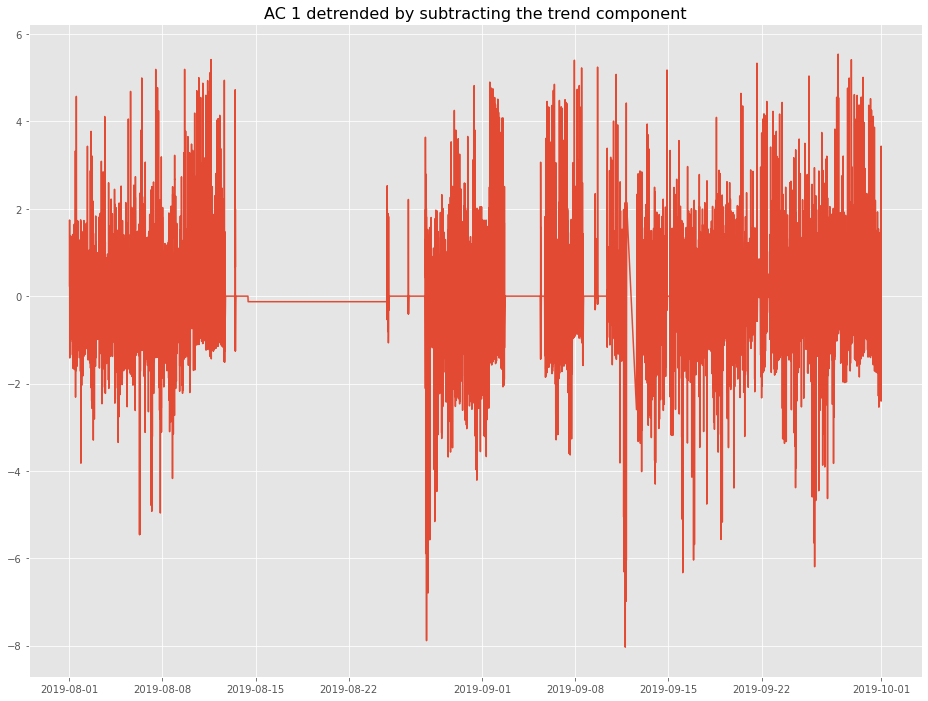

In [39]:
result_mul = seasonal_decompose(ac_no_nan.loc[:,'AC 1'], model='additive', period=30)
detrended = ac_no_nan.loc[:,'AC 1'].values - result_mul.trend
plt.plot(detrended)
plt.title('AC 1 detrended by subtracting the trend component', fontsize=16)

[]

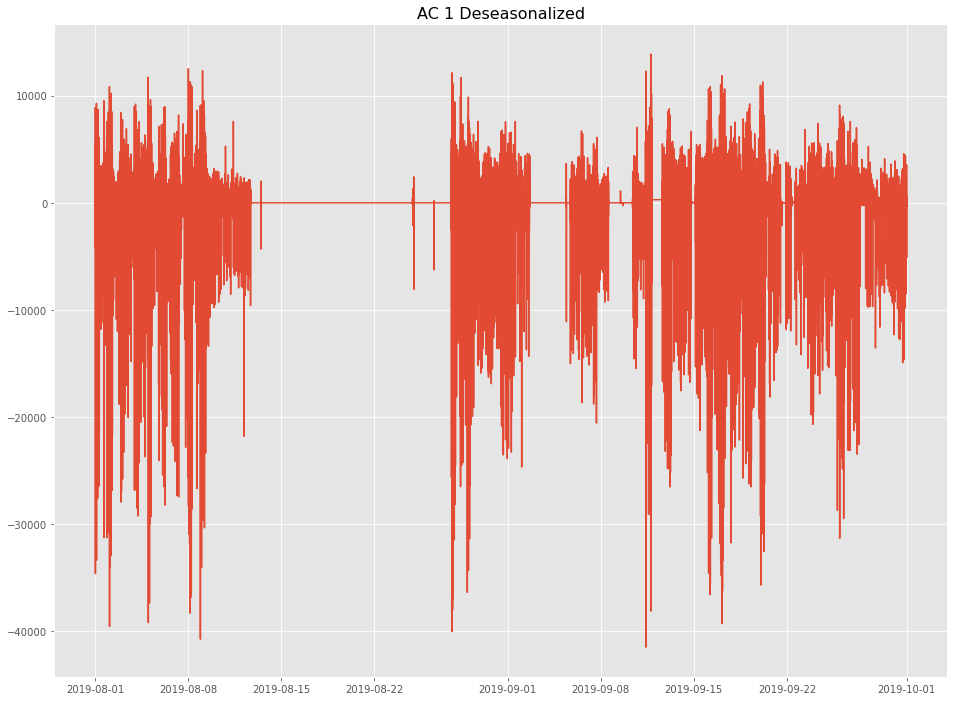

In [41]:
deseasonalized = ac_no_nan.loc[:,'AC 1'].values / result_mul.seasonal


# Plot
plt.plot(deseasonalized)
plt.title('AC 1 Deseasonalized', fontsize=16)
plt.plot()